In [1]:
import os
import math
import cv2
import numpy as np
import matplotlib.pyplot as plt
from faceparsing.parser import FaceParser
from imagine.shape.segment import ParsingSegmenter
from imagine.color import conversion
from imagine.color.utils import Recolor
from automakeup.face import extract as face_extraction, bounding
from automakeup.feature import makeup
from mtcnn import MTCNN

In [2]:
mtcnn = MTCNN()

In [3]:
face_extractor = face_extraction.SimpleFaceExtractor(512, bb_scale=1.0, interpolation=cv2.INTER_LINEAR)
bb_finder = bounding.MTCNNBoundingBoxFinder(mtcnn)

In [4]:
parser = FaceParser()

In [5]:
parts_map = {
    "skin": 1,
    "l_eye": 2,
    "r_eye": 2
}
segmenter = ParsingSegmenter(parser, parts_map=parts_map)

In [6]:
def show_eyeshadow_area(face, skin_mask, eyes_mask, extractors):
    k = len(extractors)
    max_n_cols = 2
    n_rows = math.ceil(k / max_n_cols)
    n_cols = min(k, max_n_cols)
    scale = 10
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols*scale, n_rows*scale), squeeze=False)
    for ax in axs.ravel():
        ax.axis("off")
    for i, (name, extractor) in enumerate(extractors.items()):    
        eyeshadow_mask = extractor.extract(face, skin_mask, eyes_mask)
        recolored = Recolor([0, 255, 0], 0.75)(face, mask = eyeshadow_mask)
        ax_index = (i // n_cols, i % n_cols)
        axs[ax_index].imshow(recolored)
        axs[ax_index].title.set_text(name)
    plt.tight_layout()
    plt.show()

In [7]:
from sklearn.cluster import KMeans, AgglomerativeClustering
extractors = {
    "KMeans with k=3": makeup.EyeshadowShapeExtractor(eyeshadow_clustering=KMeans(3)),
    "KMeans with k=6": makeup.EyeshadowShapeExtractor(eyeshadow_clustering=KMeans(6)),
    "AgglomerativeClustering with n=5, linkage=complete": makeup.EyeshadowShapeExtractor(eyeshadow_clustering=AgglomerativeClustering(5, linkage='complete')),
    "AgglomerativeClustering with n=5, linkage=average": makeup.EyeshadowShapeExtractor(eyeshadow_clustering=AgglomerativeClustering(5, linkage='average')),
    "AgglomerativeClustering with n=6, linkage=average": makeup.EyeshadowShapeExtractor(eyeshadow_clustering=AgglomerativeClustering(6, linkage='average')),
    "AgglomerativeClustering with n=7, linkage=average": makeup.EyeshadowShapeExtractor(eyeshadow_clustering=AgglomerativeClustering(7, linkage='average')),
}

In [8]:
image_paths = ["makeup/" + f for f in os.listdir("makeup")]

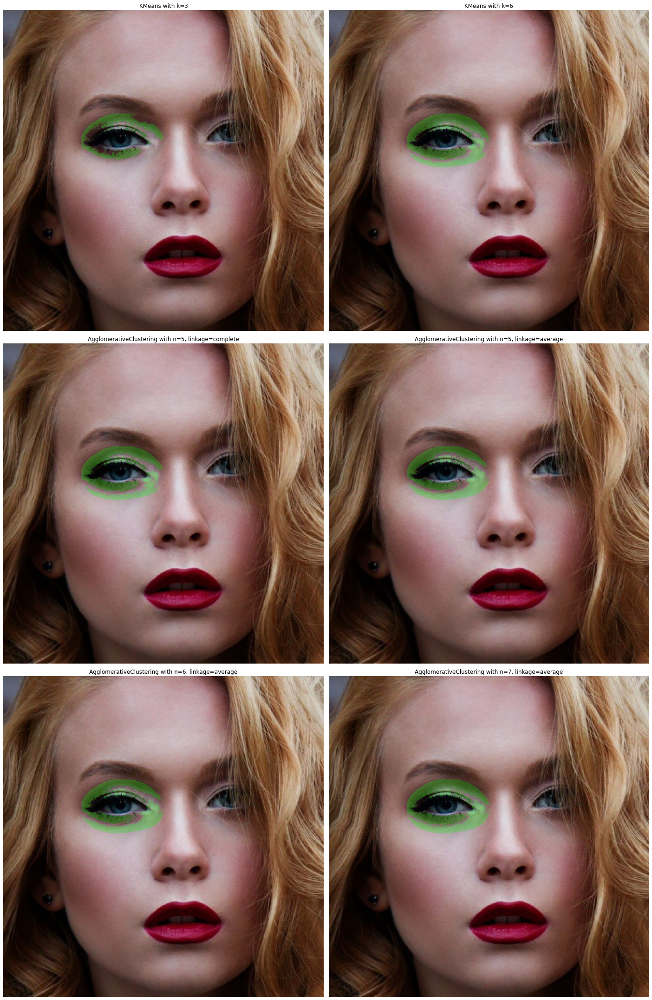

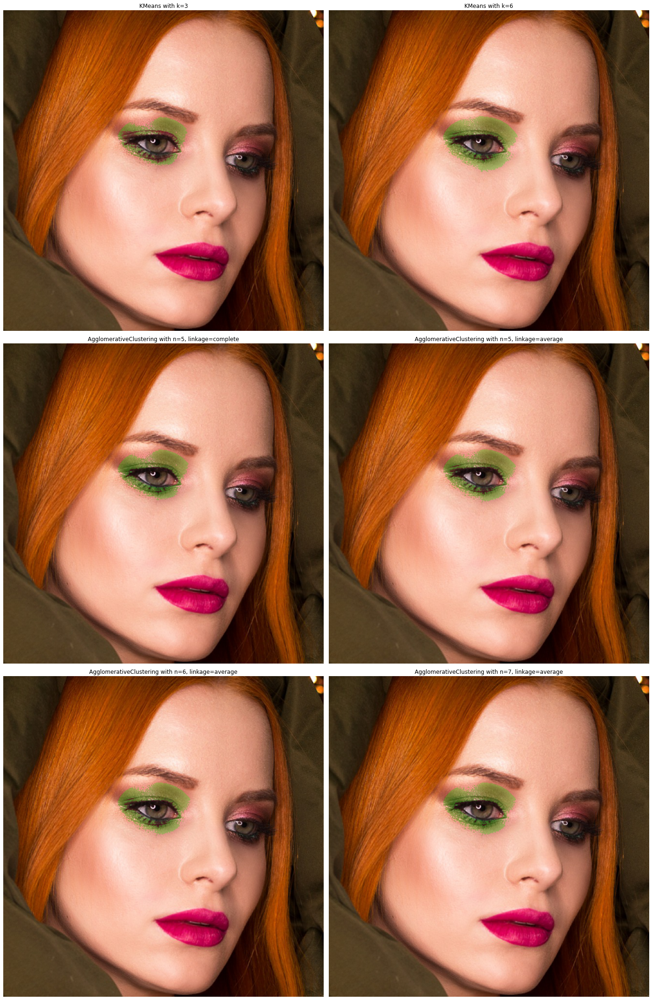

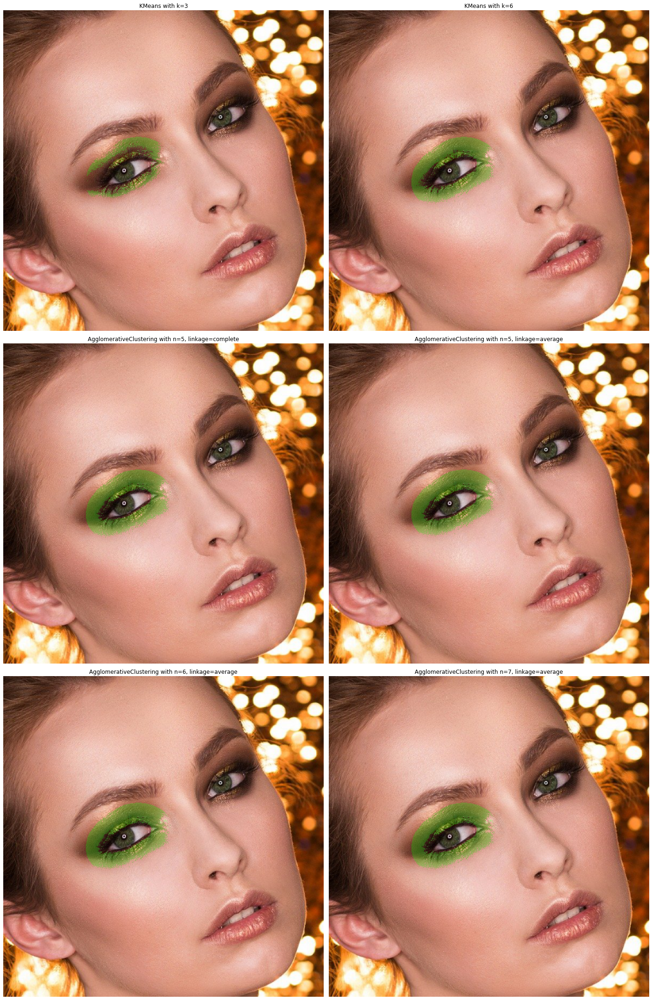

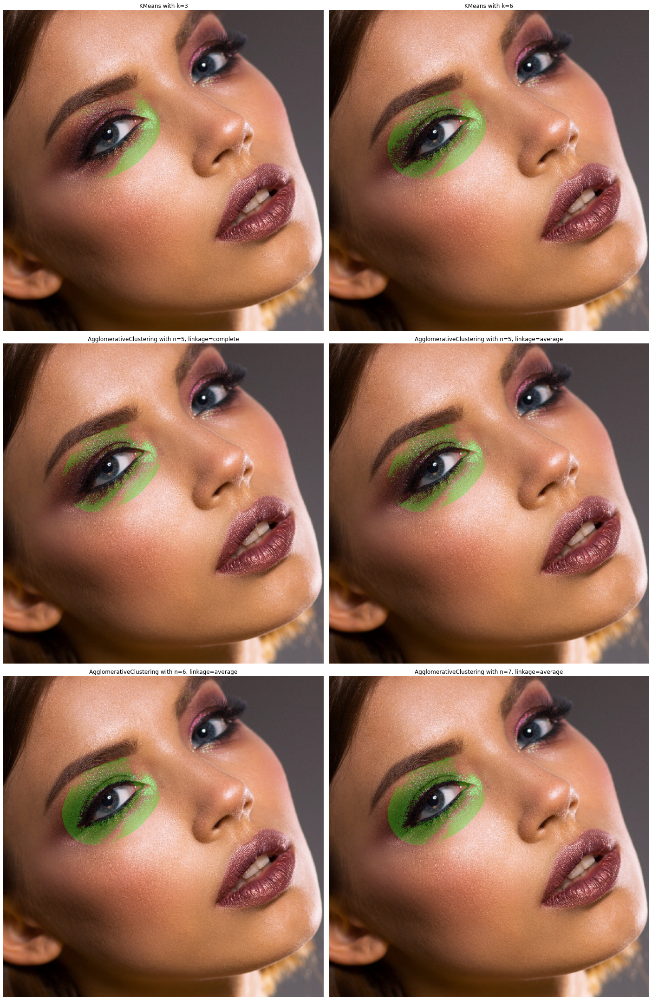

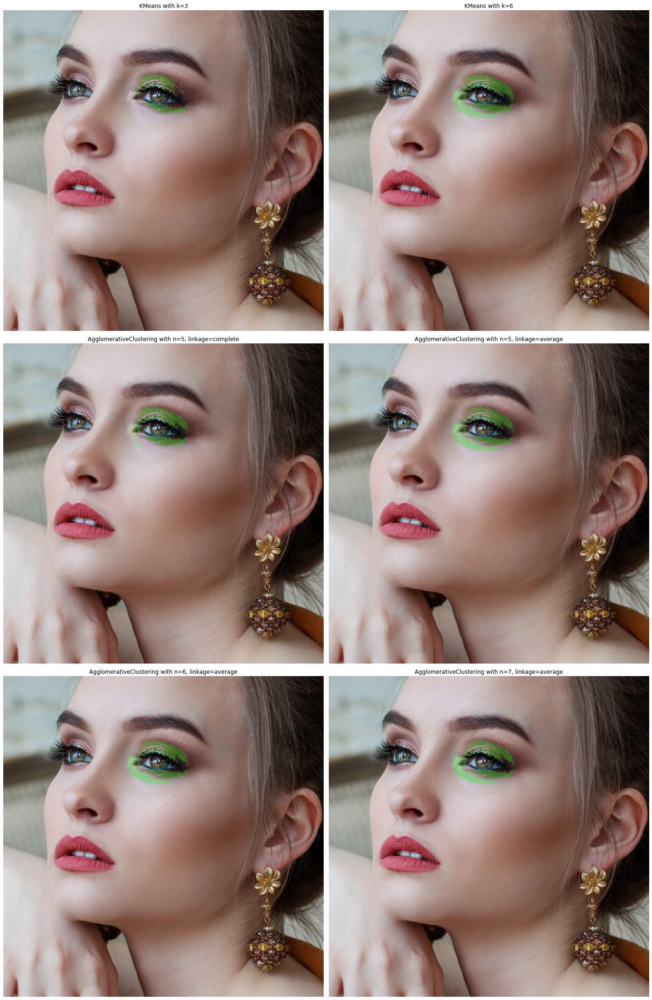

In [9]:
for path in image_paths:
    image = conversion.BgrToRgb(cv2.imread(path))
    bb = bb_finder.find(image)
    face = face_extractor.extract(image, bb)
    segmented = segmenter(face)
    show_eyeshadow_area(face, segmented == 1, segmented == 2, extractors)

In [10]:
def show_eyeshadow_colors(face, skin_mask, eyes_mask, extractor):
    fig, axs = plt.subplots(1, 2, figsize=(10, 10))
    
    colors = extractor.extract(face, skin_mask, eyes_mask)
    
    axs[0].imshow(face)
    axs[0].title.set_text("Face")
    axs[0].set_axis_off()

    axs[1].imshow([colors])
    axs[1].title.set_text("Extracted eyeshadow color palette")
    axs[1].set_axis_off()
    
    plt.tight_layout()
    plt.show()

In [11]:
eyeshadow_color_extractor = makeup.EyeshadowColorExtractor()

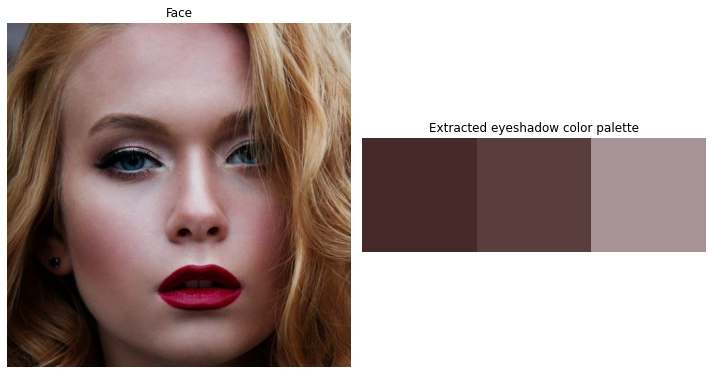

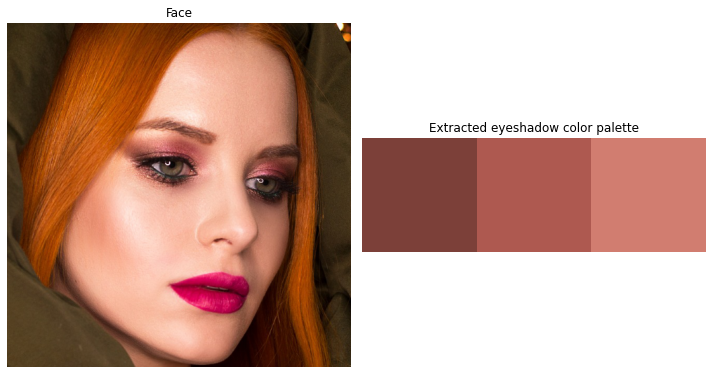

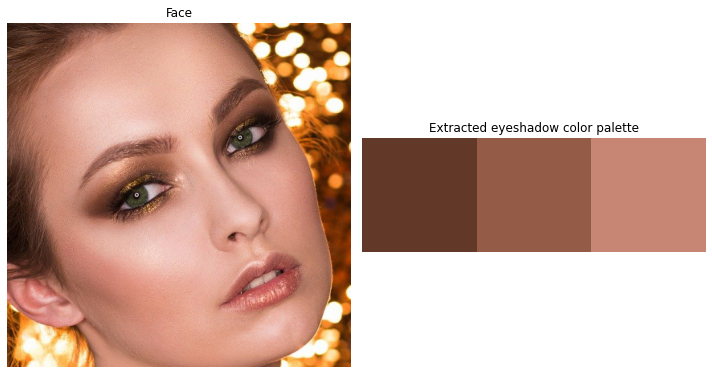

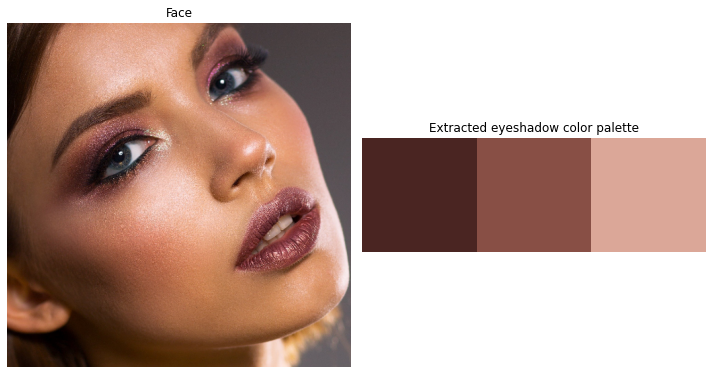

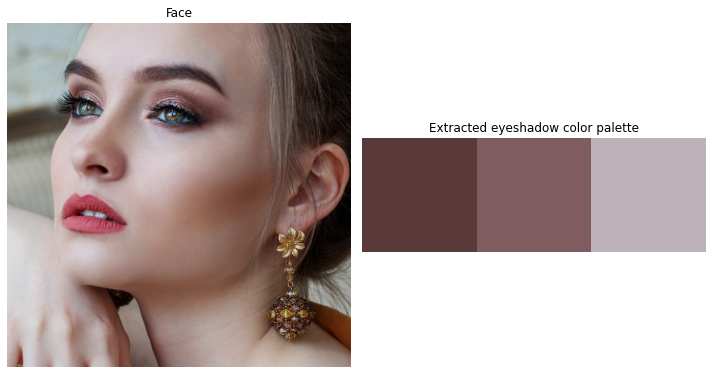

In [12]:
for path in image_paths:
    image = conversion.BgrToRgb(cv2.imread(path))
    bb = bb_finder.find(image)
    face = face_extractor.extract(image, bb)
    segmented = segmenter(face)
    show_eyeshadow_colors(face, segmented == 1, segmented == 2, eyeshadow_color_extractor)